In [16]:
import random

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import scipy.signal as signal
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.svm import OneClassSVM

from visualization import plot_scatter_2d, plot_timestamp_feature, plot_results

def load_machine(machine_num):
    """ Loads the given machine number as a pandas dataframe """
    machine_data = pd.read_csv(f"data/machine_{machine_num}.csv", names=["timestamp", "0", "1", "2", "3"], skiprows=1)
    machine_data["timestamp"] = pd.to_datetime(machine_data["timestamp"])
    return machine_data

# Tagup Data Science Exercise
## Explore the data
My first step is to explore the four timeseries data sets for different machines. To do this I plotted the four features for a random machine.

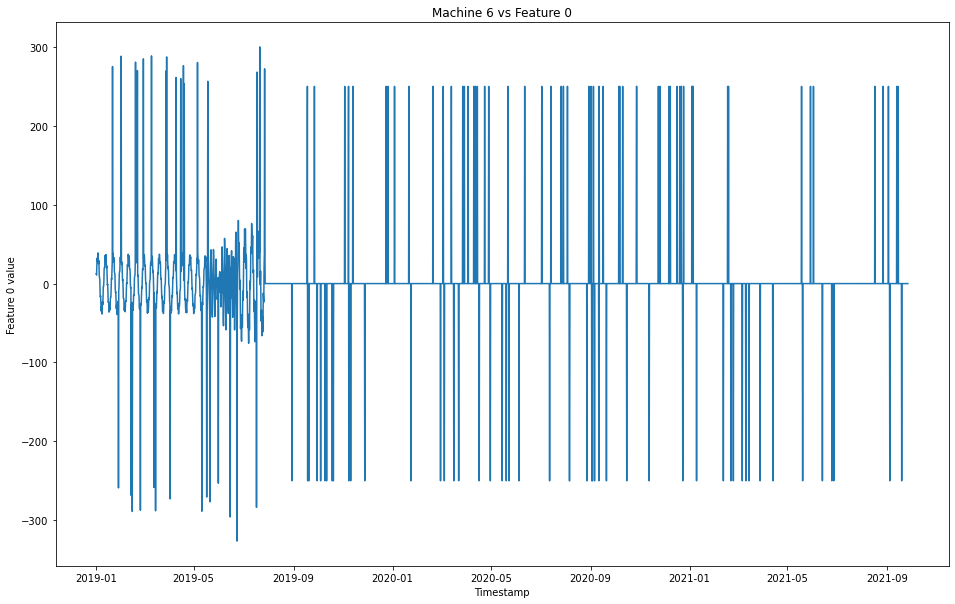

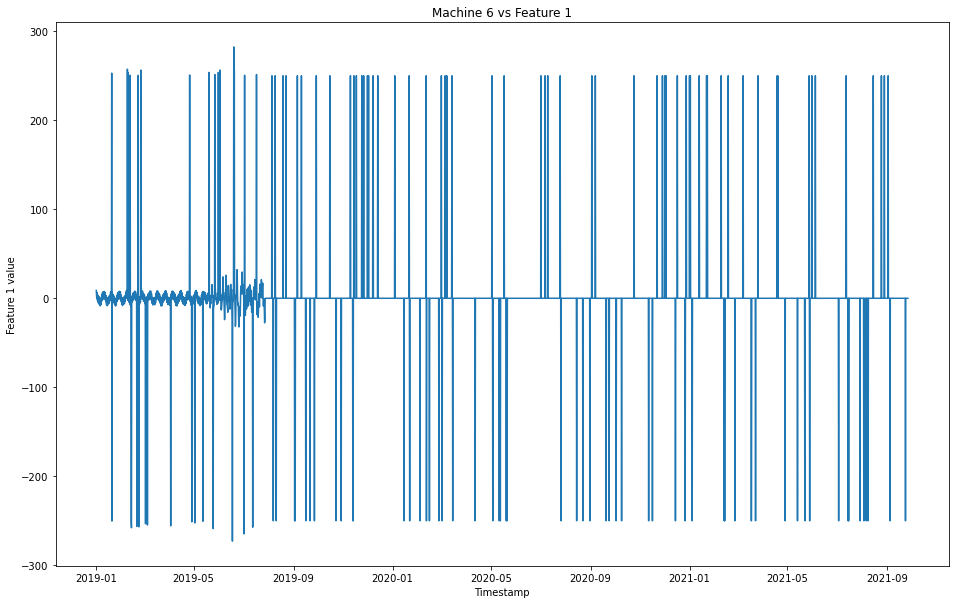

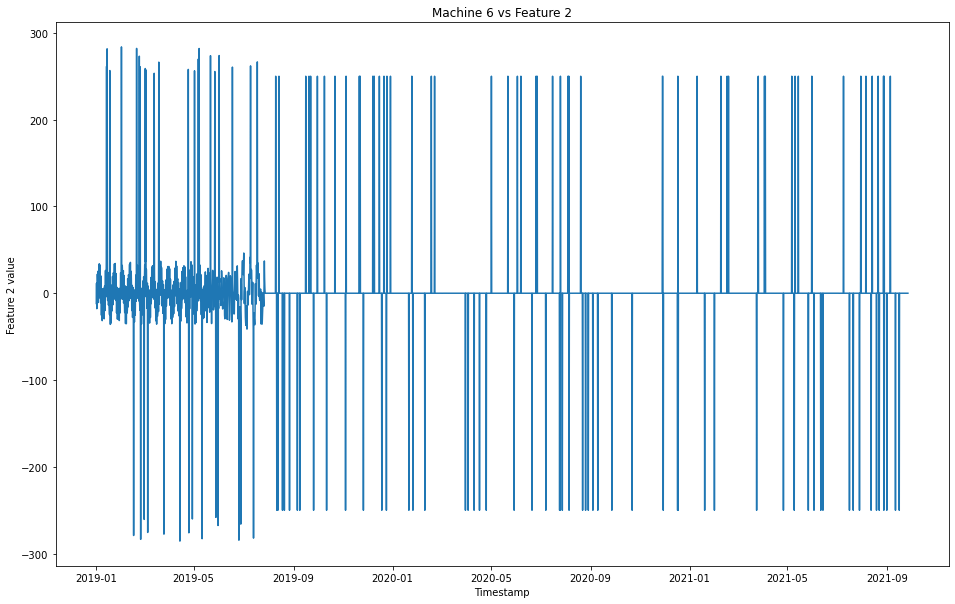

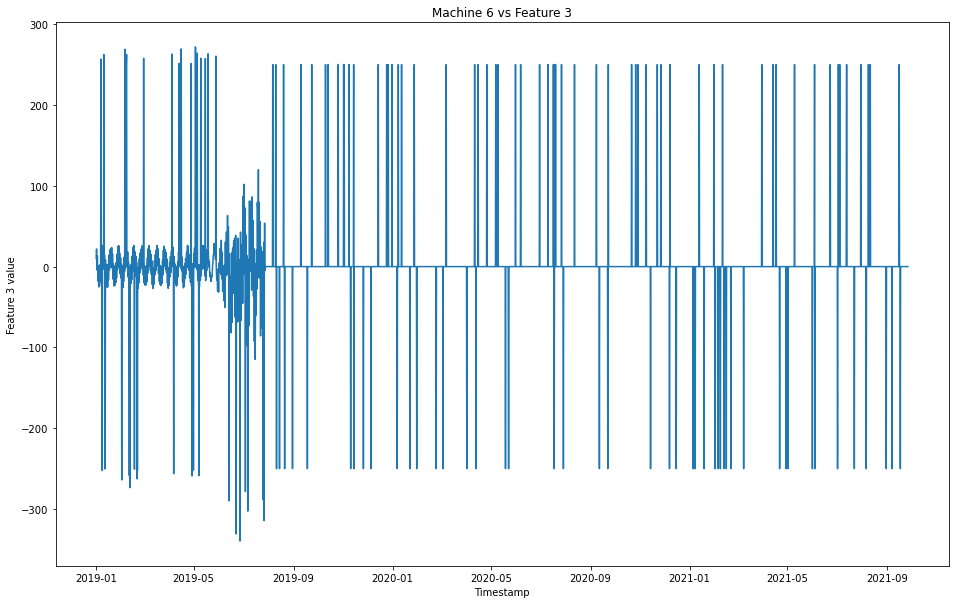

In [17]:
machine_num = random.randint(0, 19)
machine_data = load_machine(machine_num)
for feature in range(4):
    plot_timestamp_feature(machine_data["timestamp"], machine_data[f"{feature}"], title=f"Machine {machine_num} vs Feature {feature}", xlabel="Timestamp", ylabel=f"Feature {feature} value")

# Data Cleaning
## Remove Outliers
Clearly, and as suggested in the project information, there are occasional outliers. For all features and machines, it seems as though the outliers have an absolute value greater than 150. Let's remove data points with any feature that is greater in absolute value than 150 and see if the data looks cleaner.


In [18]:
def remove_outliers(data, limit=150):
    """ Cleans the data of outliers. Removes data points with an absolute value above the limit, 
    which corresponds to removing outliers """
    for col in ["0", "1", "2", "3"]:
        data = data[abs(data[col]) <= limit]
    return data

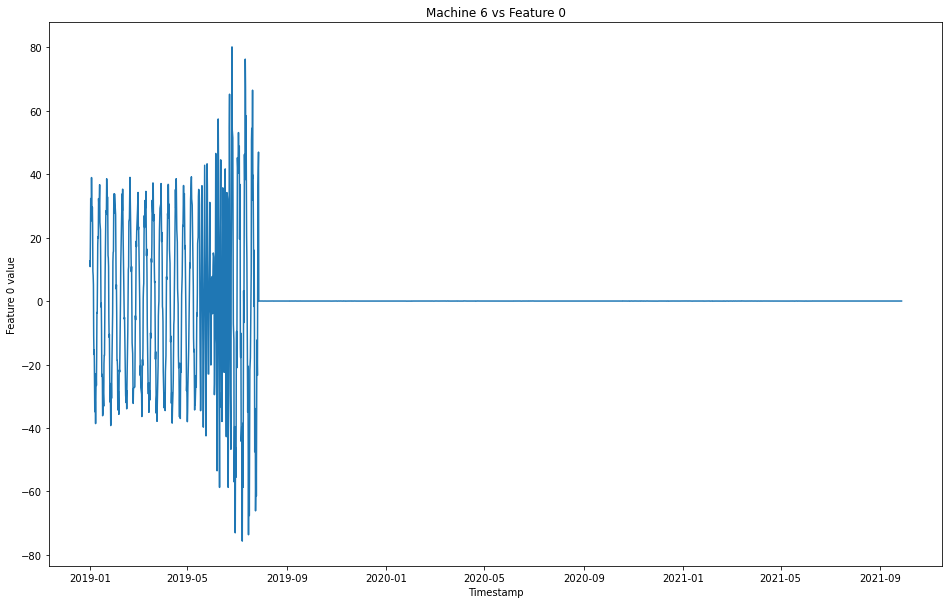

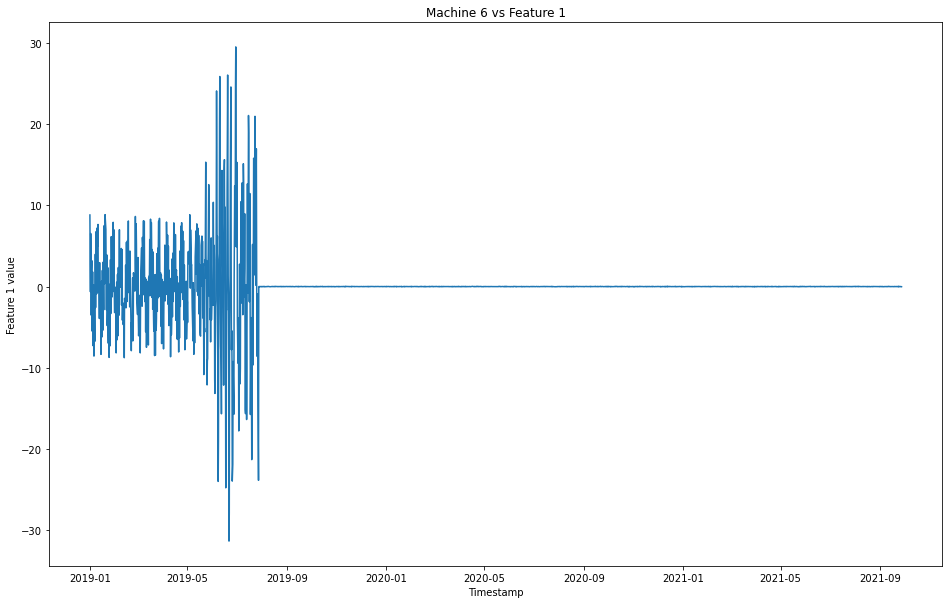

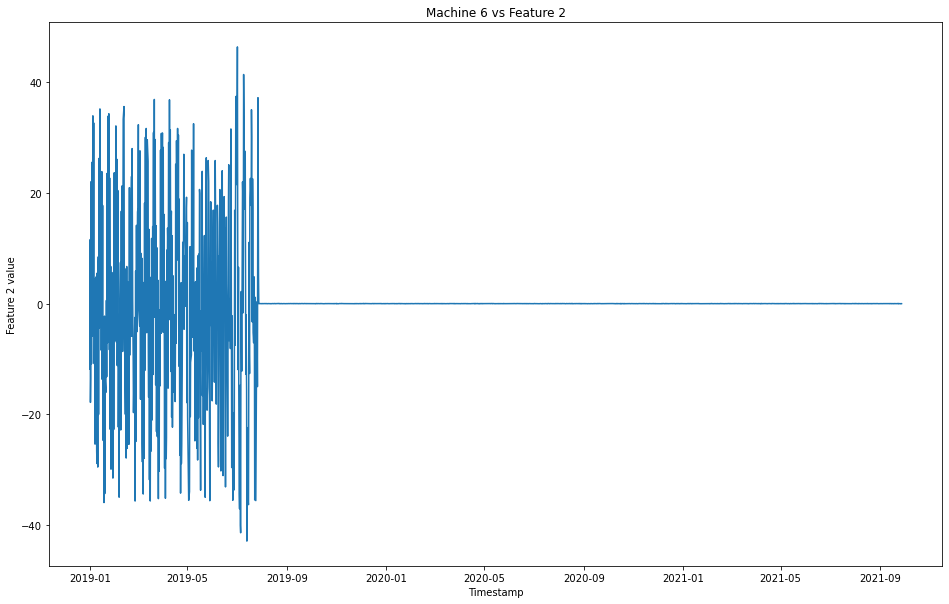

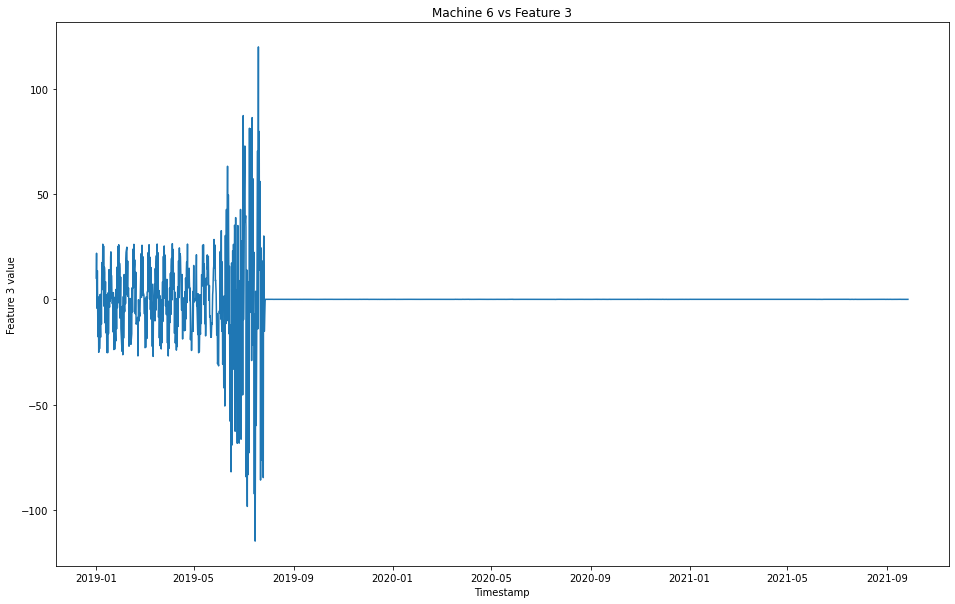

In [19]:
machine_data = remove_outliers(machine_data)
for feature in range(4):
    plot_timestamp_feature(machine_data["timestamp"], machine_data[f"{feature}"], title=f"Machine {machine_num} vs Feature {feature}", xlabel="Timestamp", ylabel=f"Feature {feature} value")

## Smooth Data
That looks better, but the signals still appear noisy. We can use a low-pass filter to isolate the cleaner waves visible in the signal. A low-pass filter will only allow signals with lower frequencies to pass through, in our case eliminating the noisy high frequency signals.

In [20]:
def smooth_signal(data, columns, N, Wn, kwargs={}):
    """ Runs a low pass filter on the specified columns of the data. 
    
    Parameters
    ----------
    data : DataFrame - the data with signals

    columns : list or str - the name(s) of columns to run the low pass filter on

    N : int - The order of the filter, passed to the scipy.signal.butter() function

    Wn : float - The critical frequency, passed to the scipy.signal.butter() function

    kwargs : dict, default={} - arguments to pass to the scipy.signal.butter() function
    
    Returns
    -------
    DataFrame - the data with the smoothed signals added as new columns
    """
    if type(columns) != list:
        columns = [columns]
    for col in columns:
        B, A = signal.butter(N, Wn, output='ba', **kwargs)
        data[f"{col}_smooth"] = signal.filtfilt(B, A, data[col])
    return data

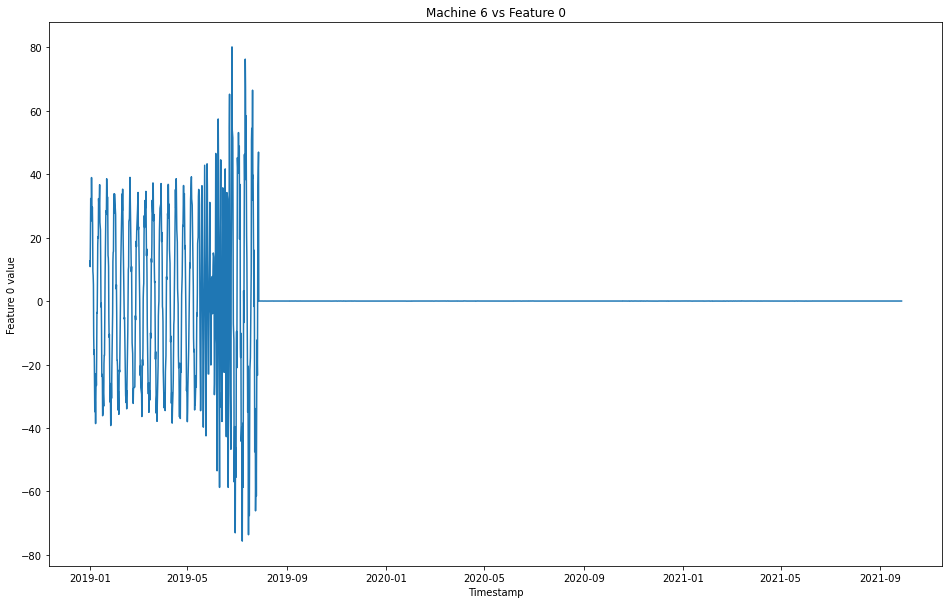

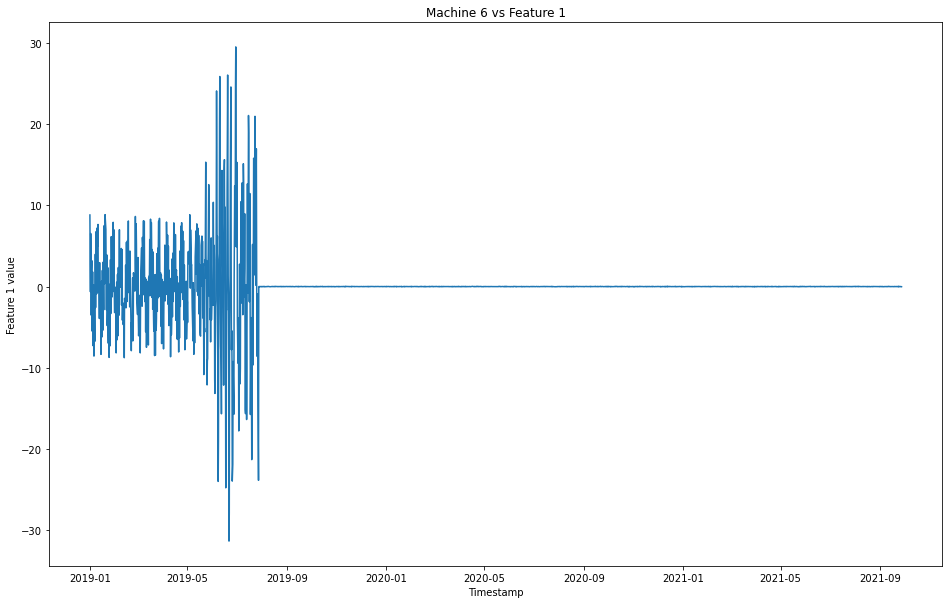

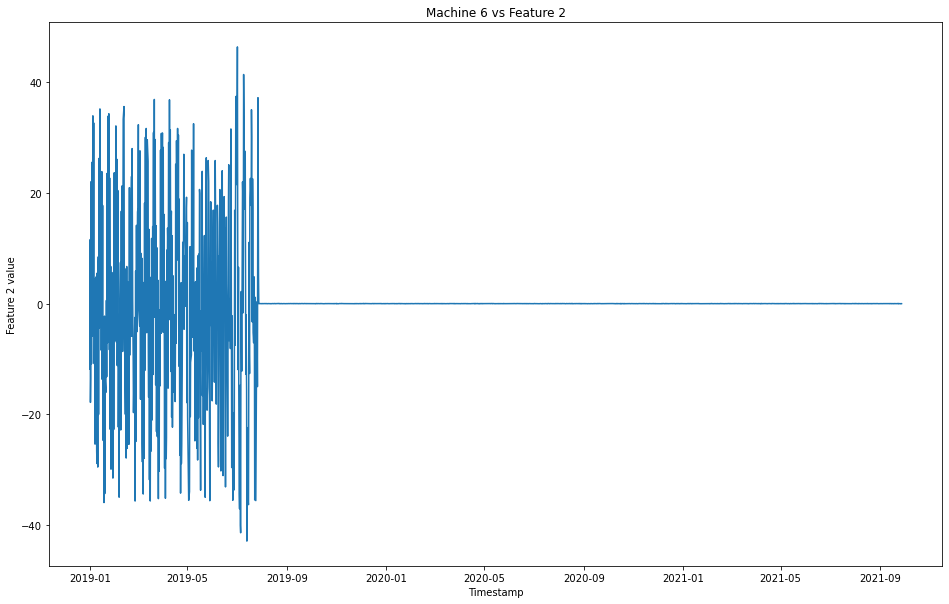

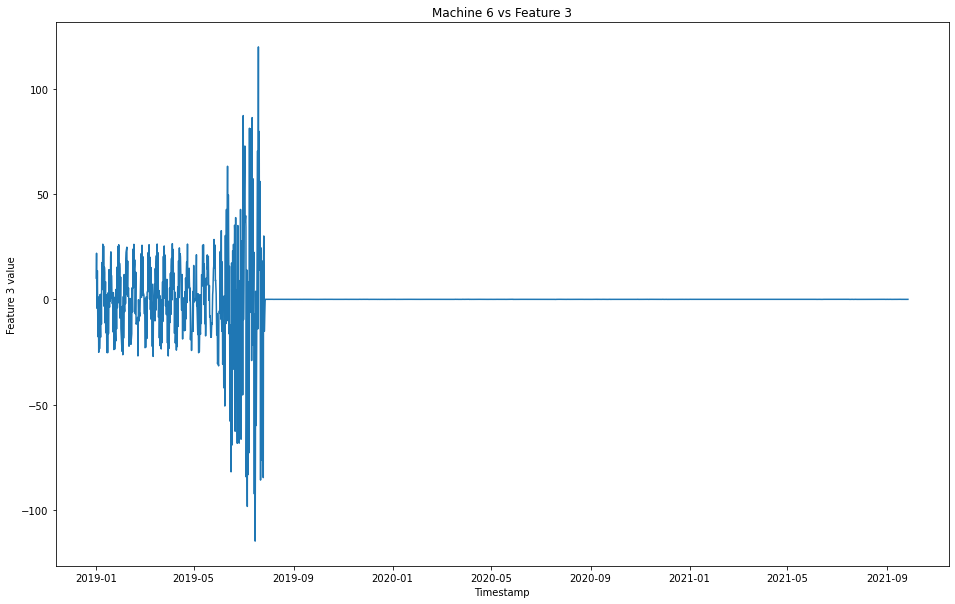

In [21]:
machine_data = smooth_signal(machine_data, ["0", "1", "2", "3"], 3, 0.5)
for feature in range(4):
    plot_timestamp_feature(machine_data["timestamp"], machine_data[f"{feature}"], title=f"Machine {machine_num} vs Feature {feature}", xlabel="Timestamp", ylabel=f"Feature {feature} value")

# Feature Engineering
Now that the data has been cleaned, we can engineer some features to help classify the signal into normal, faulty, and failed.
## Value Delta
One of the most obvious features is that the failed data is essentially all 0. If we add a feature that calculates the change in value (delta) from the previous timestamp, we should find that when the machine is failed, this change is very close to 0. That should allow us to easily separate the normal and faulty data from the failed data.


In [22]:
def delta(data, columns):
    """ Gets the difference in consecutive readings by taking the absolute value of the difference 
    between the values of two consecutive timestamps"""
    if type(columns) != list:
        columns = [columns]
    new_cols = [f"{col}_delta" for col in columns]
    delta_data = abs(data[columns].diff())
    delta_data.columns = new_cols
    return pd.concat((data, delta_data), axis=1)

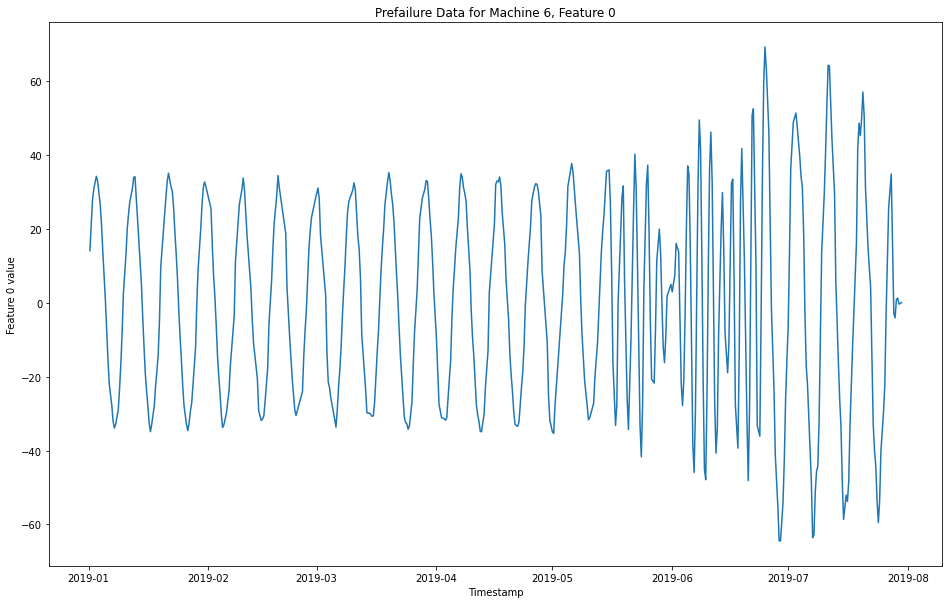

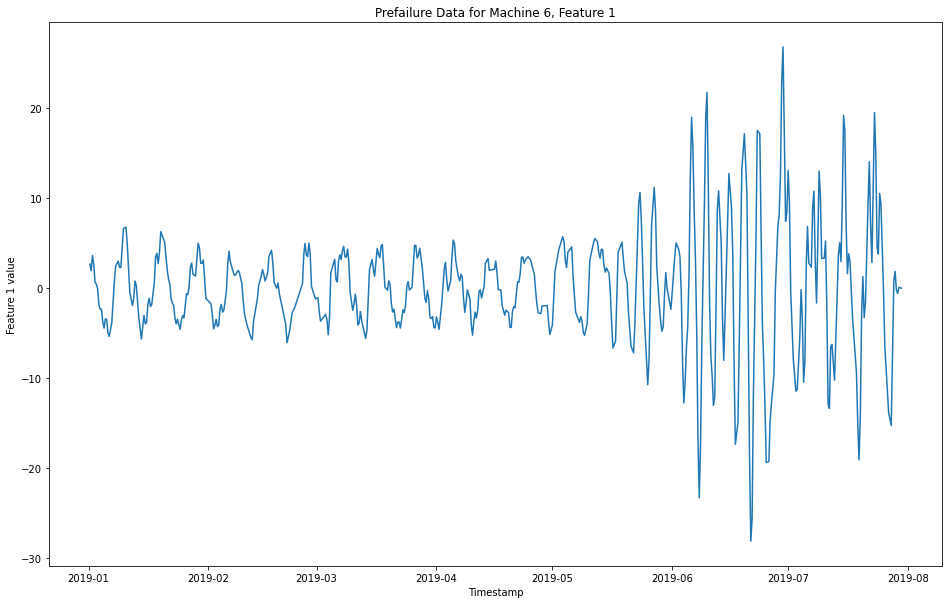

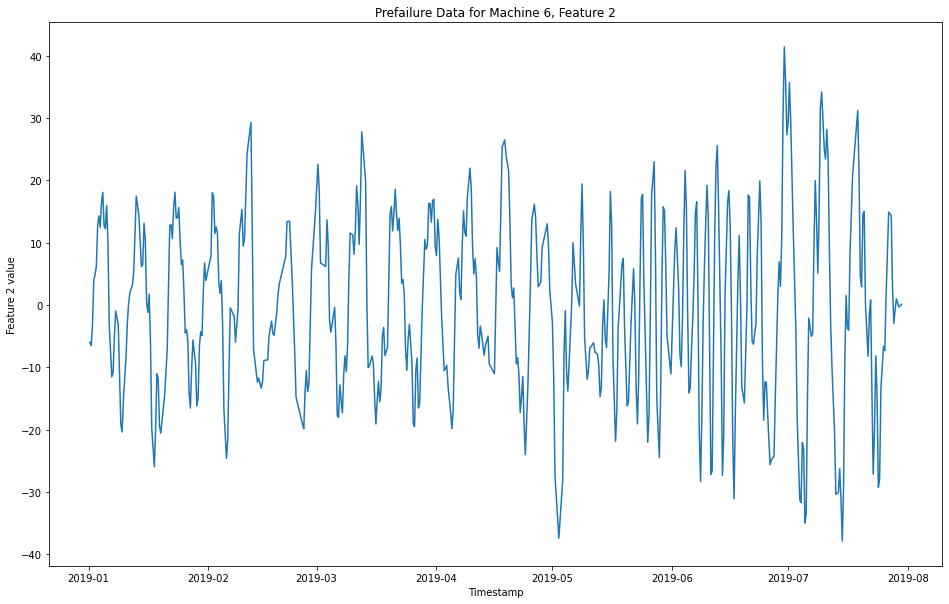

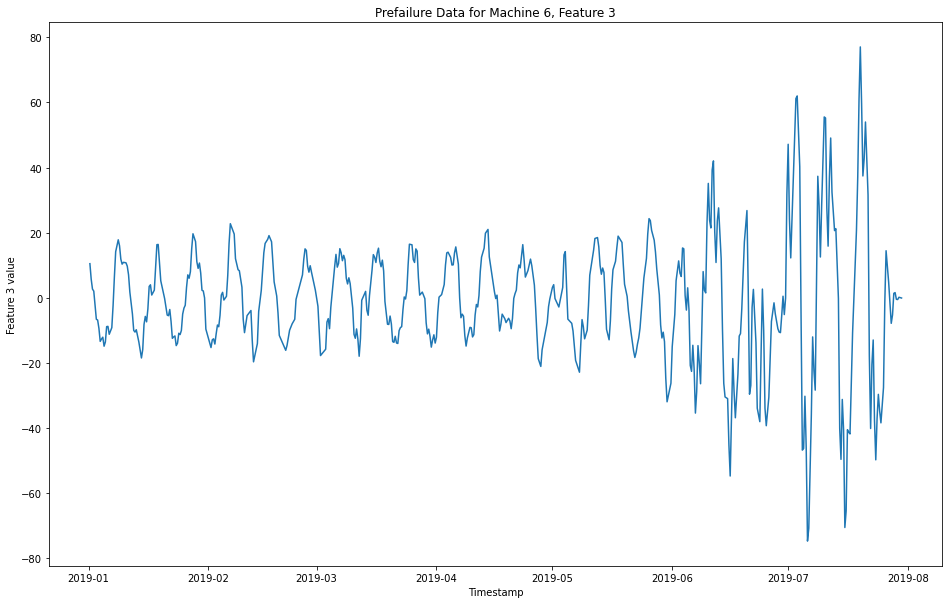

In [23]:
machine_data = delta(machine_data, ["0_smooth", "1_smooth", "2_smooth", "3_smooth"])
machine_data["smooth_delta_sum"] = machine_data[["0_smooth_delta", "1_smooth_delta", "2_smooth_delta", "3_smooth_delta"]].sum(axis=1)
prefailure_data = machine_data[machine_data["smooth_delta_sum"] > 1]
for feature in range(4):
    plot_timestamp_feature(prefailure_data["timestamp"], prefailure_data[f"{feature}_smooth"], title=f"Prefailure Data for Machine {machine_num}, Feature {feature}", xlabel="Timestamp", ylabel=f"Feature {feature} value")

Now that we can easily separate the normal and faulty data from the failed data, we need to do some work to separate the normal and faulty data. As they appear to be more similar than the failed data, we need more features. 
## Peak Heights
For most feature and machine combinations, it seems as though the faulty data has higher and more erratic peak heights compared to the normal data. Therefore, one feature we can add is, for every data point, the height of the previously detected peak.

In [24]:
def is_peak(data, columns):
    """ Finds the signal peaks for the given columns. Returns a new column where the value is 0 if 
    the timestamp is not a peak and the value at the timestamp if the timestamp is a peak. """
    if type(columns) != list:
        columns = [columns]
    for col in columns:
        new_col_name = f"{col}_peak_height"
        peaks, _ = signal.find_peaks(data[col], distance=5)
        peaks_idx = [data.index[x] for x in peaks]
        peaks = pd.DataFrame(np.ones(len(peaks)), index=peaks_idx, columns=[new_col_name])
        data = data.join(peaks)
        data[new_col_name] = data[new_col_name].fillna(0)
        data[new_col_name] = data[new_col_name]*data[col]
    return data

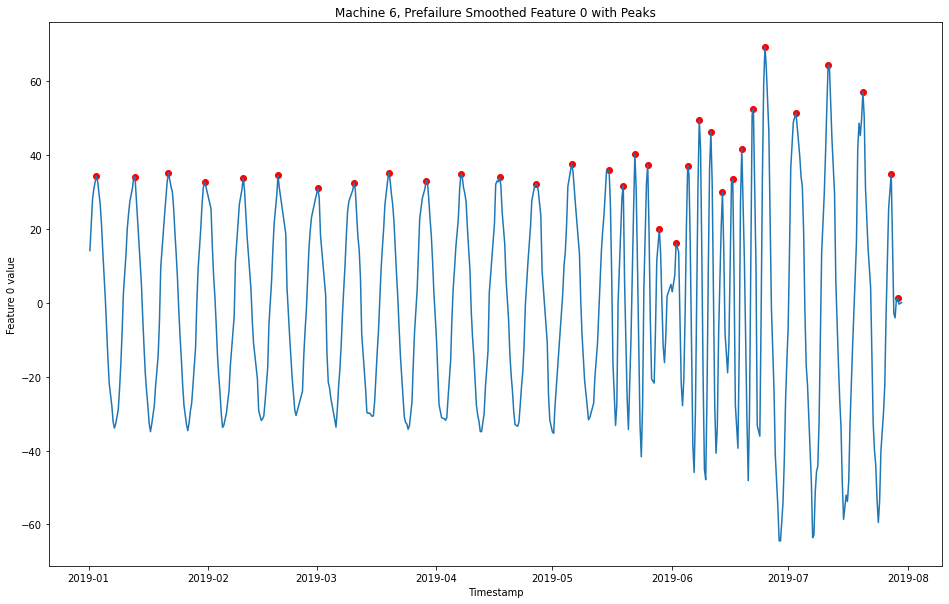

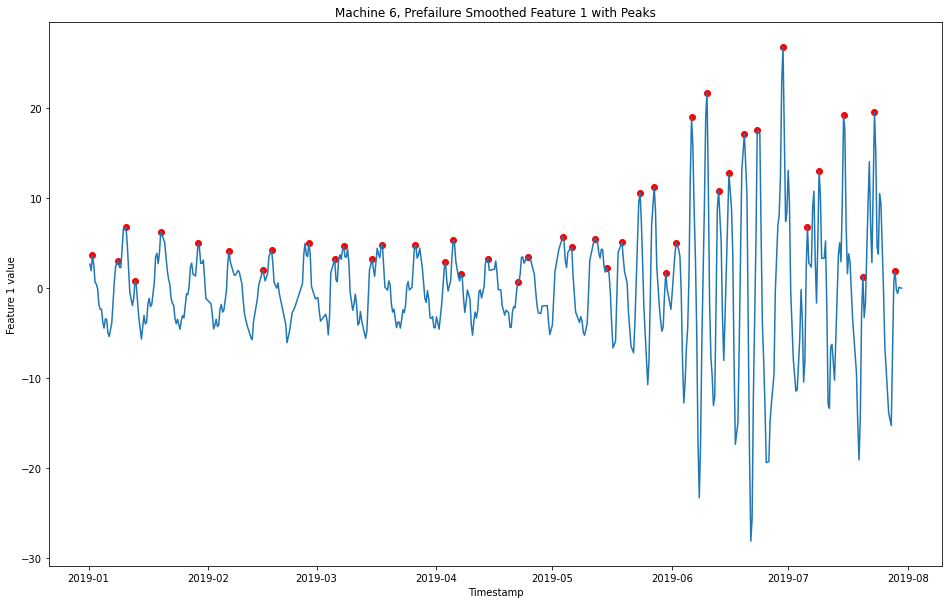

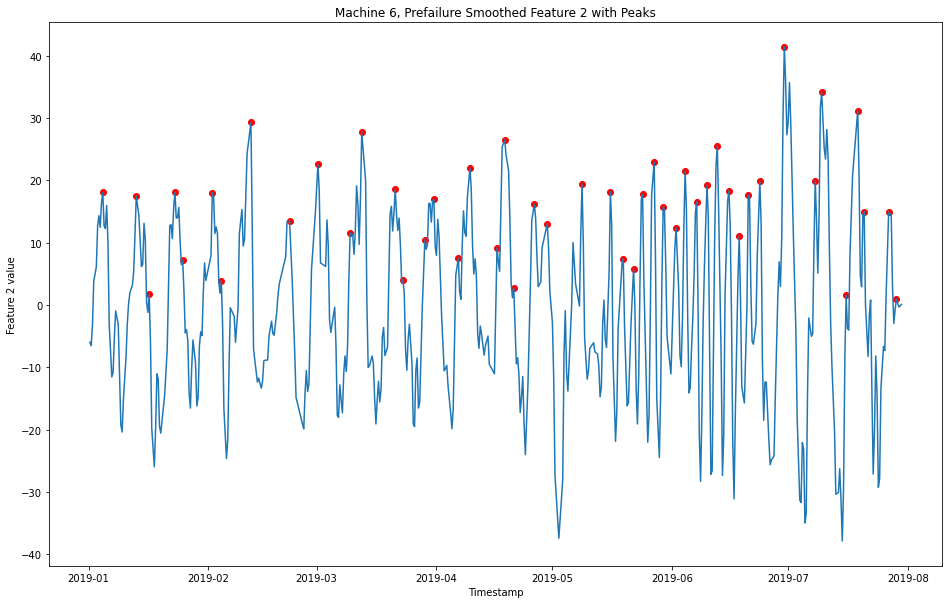

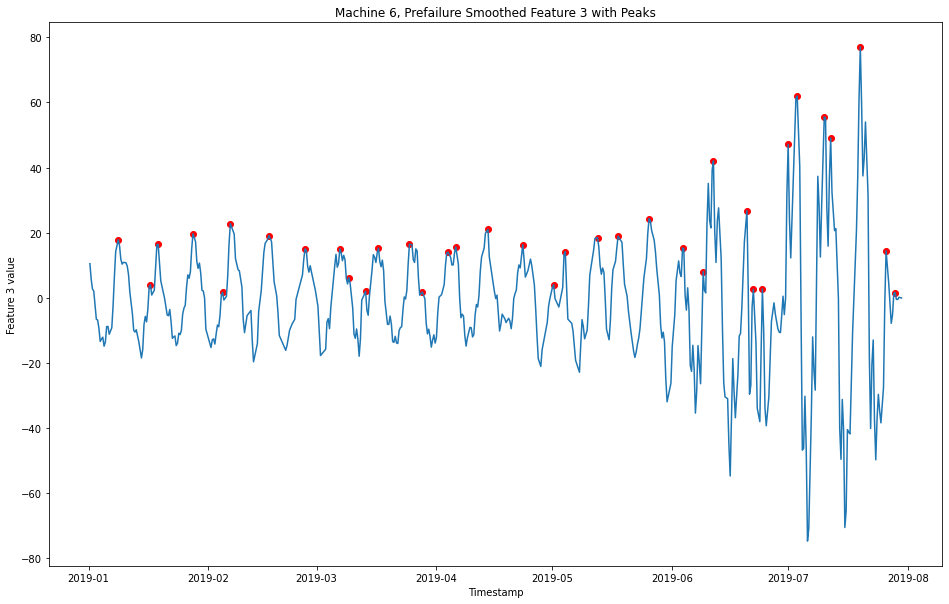

In [25]:
prefailure_data = is_peak(prefailure_data, ["0_smooth", "1_smooth", "2_smooth", "3_smooth"])
for feature in range(4):
    peaks = prefailure_data[prefailure_data[f"{feature}_smooth_peak_height"] > 0.5]
    
    # Plot signal with peaks
    fig = plt.figure(num=None, figsize=(16, 10))
    ax1 = fig.add_subplot(111)
    ax1.scatter(peaks["timestamp"], peaks[f"{feature}_smooth_peak_height"], color="red")
    ax1.plot(prefailure_data["timestamp"], prefailure_data[f"{feature}_smooth"])
    ax1.set_title(f"Machine {machine_num}, Prefailure Smoothed Feature {feature} with Peaks")
    ax1.set_xlabel("Timestamp")
    ax1.set_ylabel(f"Feature {feature} value")
    plt.show()

It seems as though for features 0, 1, and 3 the peak heights significantly change as the signal goes from normal to faulty. We can make features that measure both of those things.

In [26]:
def peak_height_diff(data, columns):
    """ Finds the height difference between peaks. Must have the peak_height feature for 
    each input column. """
    if type(columns) != list:
        columns = [columns]
    for col in columns:
        assert(f"{col}_peak_height") in data.columns
        old_col = f"{col}_peak_height"
        new_col = f"{col}_peak_height_diff"
        diff_data = data[old_col][data[old_col] > 1e-8]
        diff_data = abs(diff_data.diff())
        diff_data.name = new_col
        data = data.join(diff_data)
        data[new_col] = data[new_col].fillna(method="ffill")
    return data

def peak_prev_height(data, columns):
    """ Finds the height of the previous peak. If no previous peak then the value is np.nan. """
    if type(columns) != list:
        columns = [columns]
    for col in columns:
        new_col = f"{col}_peak_prev_height"
        peaks, _ = signal.find_peaks(data[col], distance=5)
        peaks_idx = [data.index[x] for x in peaks]
        peaks = pd.DataFrame(np.ones(len(peaks)), index=peaks_idx, columns=[new_col])
        data = data.join(peaks)
        data[new_col] = data[new_col]*data[col]
        data[new_col] = data[new_col].fillna(method="ffill")
    return data

In [27]:
prefailure_data = peak_height_diff(prefailure_data, ["0_smooth", "1_smooth", "3_smooth"])
prefailure_data = peak_prev_height(prefailure_data, ["0_smooth", "1_smooth", "3_smooth"])

# Putting it all together
The final step is to train a model. Here I chose to use a One Class SVM, which is an unsupervised classifier. For model selection and tuning I did a modified version of leave on out cross validation (LOOCV). Since the data are not labeled, there is no accuracy metric that can be used to measure the results. However, we can still train the model on subsets of machines and then validate on others and see the results. Specifically, for each machine, I train on all the other machines, and then test on the remaining machine. 

In [28]:
def prepare_data(data):
    data = remove_outliers(data)
    data = smooth_signal(data, ["0", "1", "2", "3"], 3, 0.5)
    data = delta(data, ["0_smooth", "1_smooth", "2_smooth", "3_smooth"])
    data["smooth_delta_sum"] = data[["0_smooth_delta", "1_smooth_delta", "2_smooth_delta", "3_smooth_delta"]].sum(axis=1)
    prefailure_data = data[data["smooth_delta_sum"] > 1]
    failure_data = data[data["smooth_delta_sum"] < 1]
    failure_data["class"] = 2*np.ones(failure_data.shape[0])
    prefailure_data = is_peak(prefailure_data, ["0_smooth", "1_smooth", "2_smooth", "3_smooth"])
    prefailure_data = peak_height_diff(prefailure_data, ["0_smooth", "1_smooth", "3_smooth"])
    prefailure_data = peak_prev_height(prefailure_data, ["0_smooth", "1_smooth", "3_smooth"])
    return prefailure_data, failure_data["class"]

In [29]:
# Load, prepare, and save all machine datasets
machines = []
machines_prefailure = []
machines_failure = []
for i in range(20):
    data = load_machine(i)
    machines.append(data)
    prefailure, failure = prepare_data(data)
    machines_prefailure.append(prefailure)
    machines_failure.append(failure)

# Train, test, and save predictions for each machine
predictions = []
final_columns = [
    "0_smooth_peak_height_diff", 
    "0_smooth_peak_prev_height",
    "1_smooth_peak_height_diff", 
    "1_smooth_peak_prev_height",
    "3_smooth_peak_height_diff", 
    "3_smooth_peak_prev_height",
]

# Predict on each machine
for i in range(20):
    # Get train and test sets
    train_data = pd.concat([x for j, x in enumerate(machines_prefailure) if j != i])
    test_data = machines_prefailure[i]

    # Select final columns
    train_data = train_data[final_columns]
    test_data = test_data[final_columns]

    # Drop nan values and shuffle
    train_data = train_data.dropna().sample(frac=1)
    test_data = test_data.dropna().sample(frac=1)  
    
    # Train and predict
    model = OneClassSVM(kernel="rbf", nu=0.15).fit(train_data)
    preds = model.predict(test_data)
    test_data["predictions"] = preds
    predictions.append(test_data["predictions"])

# Results
Below I display the results for each feature of each machine. For each machine, the model was trained with data from every other machine. Each color corresponds to the mode that the model predicted. Green is regular, blue is faulty, red is failed, and grey is an outlier/not enough data. For most machines, the majority of the noisy data is colored blue which is correct. There are occasional patches of faulty during the regular data, but these can be mitigated with more parameter tuning, especially with the 'n' parameter in the One Class SVM model. The customer can decide the threshold of false positives that can be tolerated. The downside of less false positives is more false negatives, so an acceptable balance would need to be found. The beginning of each machine's data is marked as outlier/not enough data because there is no previous peak for that data, so the model cannot make predictions. Overall, I feel this simple model does a good job finding the faulty data early enough to warn of a faulty state before a failure occurs. There are some false positives, but a simple tuning can remove them at the expense of a later faulty warning. Additionally, with more time, more features can be added to help with better predictions.

Thank you for taking the time to review my work, and I look forward to hearing from Tagup soon!

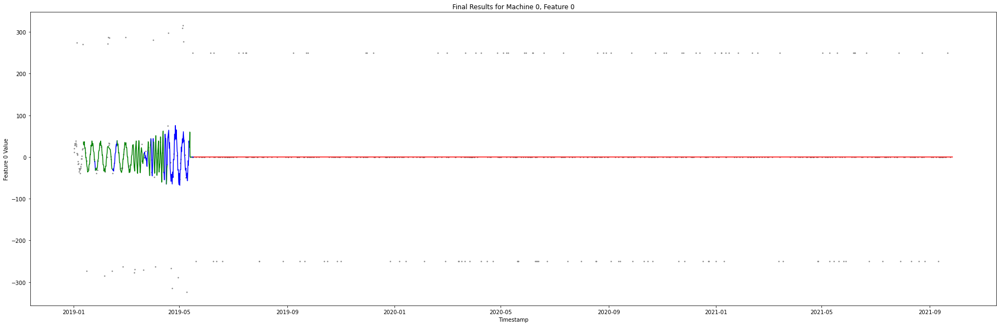

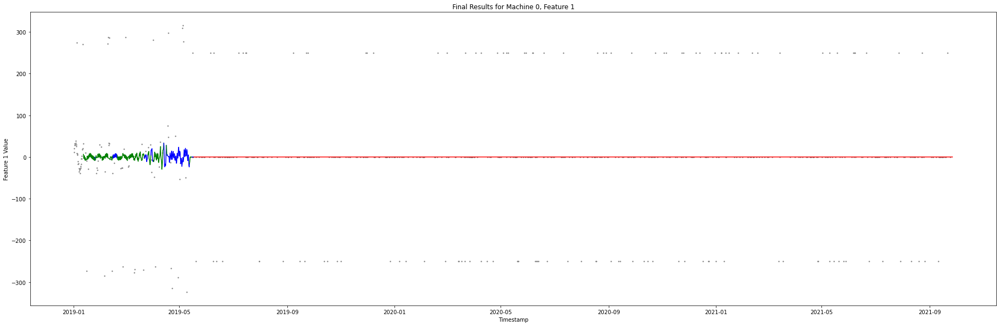

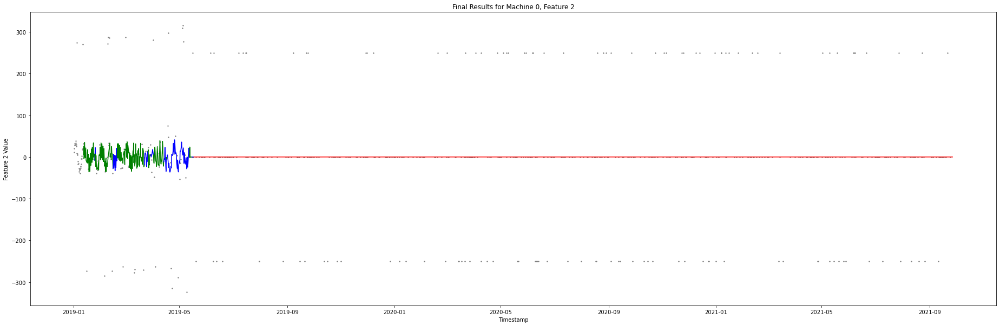

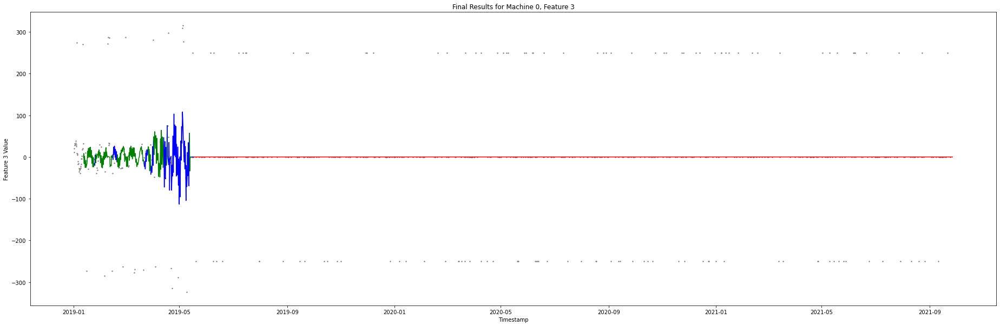

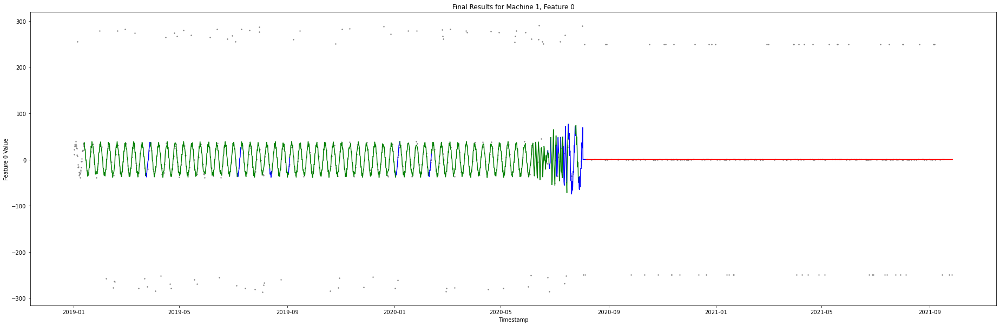

...

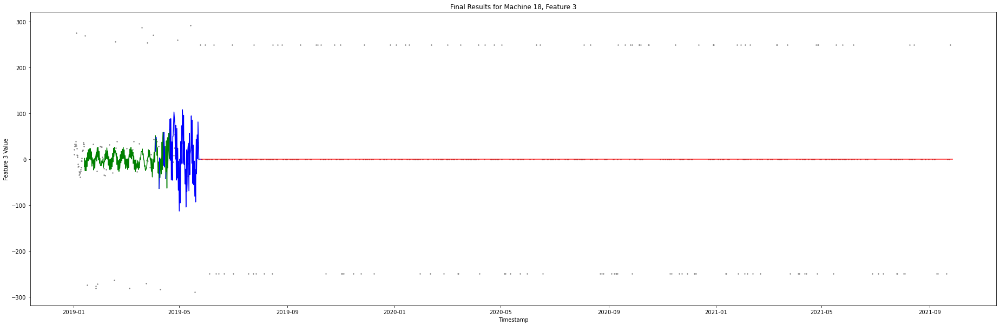

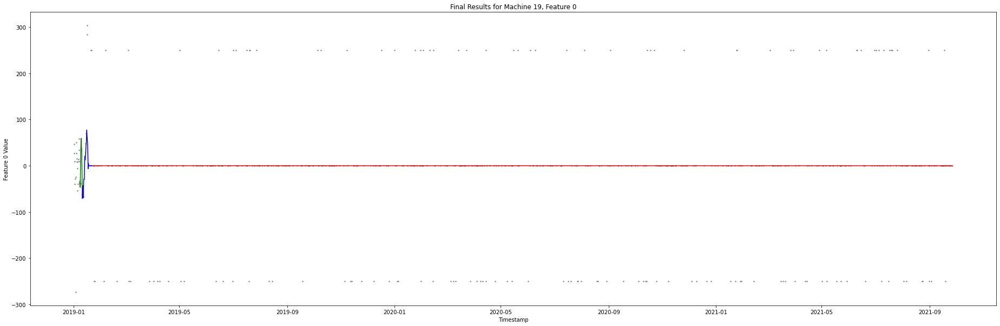

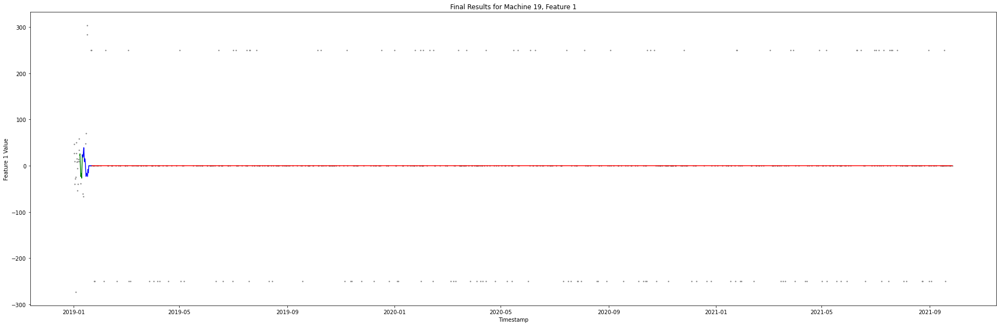

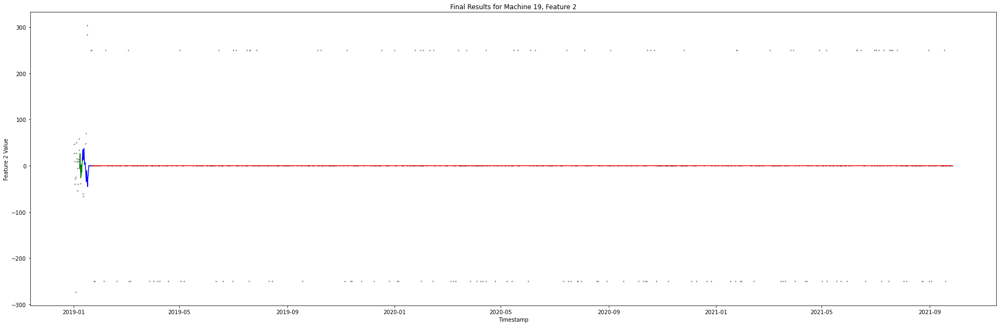

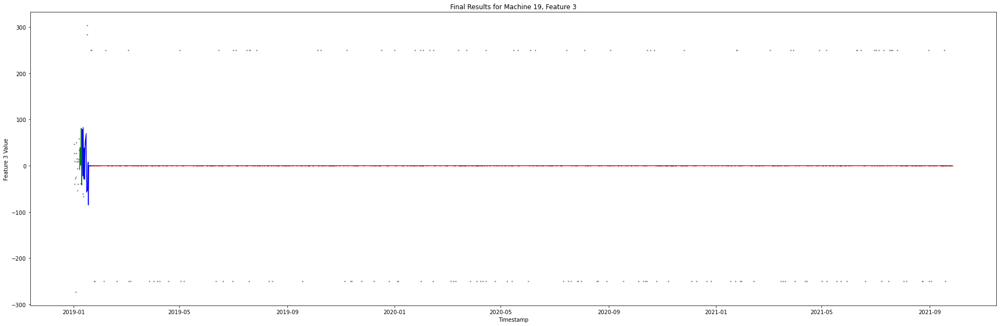

In [30]:
cmap = {
    -1: "blue",
    1: "green",
    2: "red",
    3: "grey"
}

# Display predictions
for i in range(20):
    original_data = machines[i]
    failed = machines_failure[i]
    prediction = predictions[i]
    final_data = original_data.join(failed)
    final_data = final_data.join(prediction)
    final_data["predictions"] = final_data["predictions"].fillna(final_data["class"])
    final_data["predictions"] = final_data["predictions"].fillna(3)
    final_data["colors"] = final_data["predictions"].apply(lambda x : cmap[x])
    final_data = final_data.drop(columns="class")
    plot_results(final_data, i)